# Weather Image Recognition via VGGNet

## Importing the main libraries

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import tensorflow as tf
from   tensorflow import keras

import os
from google.colab import drive
drive.mount('/content/drive' , force_remount=True )

Mounted at /content/drive


## Images Preprocessing

### Reading the Images path

In [36]:
DATASET_PATH = "/content/drive/MyDrive/Weather Image Recognition Projects/dataset"

DATASET_PATH

'/content/drive/MyDrive/Weather Image Recognition Projects/dataset'

### Defining the images' shape

In [37]:
Img_Dimensions = ( 224 , 224 )     # standered input for VGGNet pretrained model
Batch_size     = 32

SEED  = 123

### Splitting the Images into Training , Validation and Testing

In [38]:
# Training Dataset
Train_dataset = tf.keras.utils.image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.3,   # 30% reserved for val+test
    subset="training",
    seed=SEED,
    image_size= Img_Dimensions,
    batch_size= Batch_size,
    shuffle=True,
    color_mode="rgb"
)


# Validation & Testing Dataset
val_test_dataset = tf.keras.utils.image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.3,
    subset="validation",
    seed=SEED,
    image_size= Img_Dimensions,
    batch_size= Batch_size,
    shuffle=True,
    color_mode="rgb"
)

# validation data size
val_batches = int(len(val_test_dataset) * (2/3))


# splitting the validation from testing
validation_dataset = val_test_dataset.take(val_batches)
Testing_dataset    = val_test_dataset.skip(val_batches)


# Enhace Performance
AUTOTUNE = tf.data.AUTOTUNE
Train_dataset = Train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
Testing_dataset = Testing_dataset.prefetch(buffer_size=AUTOTUNE)


Found 6862 files belonging to 11 classes.
Using 4804 files for training.
Found 6862 files belonging to 11 classes.
Using 2058 files for validation.


In [39]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
class_names = sorted(os.listdir(DATASET_PATH))

print(class_names)


['dew', 'fogsmog', 'frost', 'glaze', 'hail', 'lightning', 'rain', 'rainbow', 'rime', 'sandstorm', 'snow']


### Preprocess images for VGGNet model comptability

In [41]:
from tensorflow.keras.applications.vgg16 import preprocess_input

def preprocess(image, label):
    image = preprocess_input(image)
    return image, label

Train_dataset       = Train_dataset.map(preprocess)
validation_dataset  = validation_dataset.map(preprocess)
Testing_dataset     = Testing_dataset.map(preprocess)


## showing the results

In [42]:
print(f"Number of images in Training Dataset: {len(list(Train_dataset.unbatch()))}")
print(f"Number of images in Validation Dataset: {len(list(validation_dataset.unbatch()))}")
print(f"Number of images in Testing Dataset: {len(list(Testing_dataset.unbatch()))}")

Number of images in Training Dataset: 4804
Number of images in Validation Dataset: 1376
Number of images in Testing Dataset: 682


In [43]:
for imageBatch , labelBatch in Train_dataset.take(1):
  print(imageBatch.shape)
  print(labelBatch.shape)

for imageBatch , labelBatch in validation_dataset.take(1):
  print(imageBatch.shape)
  print(labelBatch.shape)

for imageBatch , labelBatch in Testing_dataset.take(1):
  print(imageBatch.shape)

(32, 224, 224, 3)
(32,)
(32, 224, 224, 3)
(32,)
(32, 224, 224, 3)


In [44]:
print(labelBatch)      # sparse not categorical

tf.Tensor(
[ 0  8  9  0  5  8  4 10  4  0  7  9  6  4  1  9  8  5  7  4  3  9  3  8
  8  3  4  8  0  8  5  5], shape=(32,), dtype=int32)


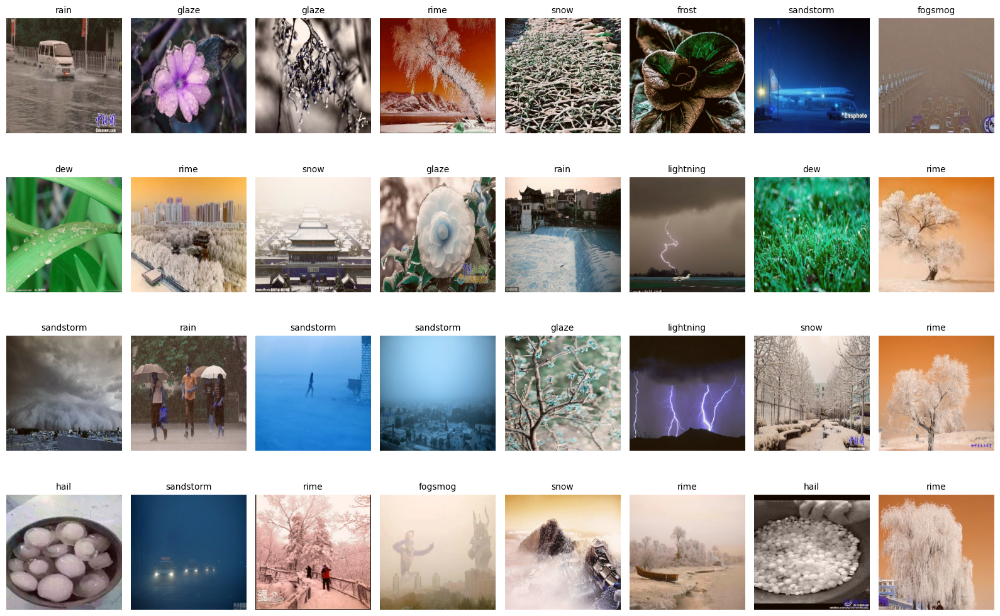

In [45]:
plt.figure(figsize=(16, 10.5))

# Take one batch from the training dataset
for i, (image, label) in enumerate(Train_dataset.take(1).unbatch().take(Batch_size)): # Unbatch and take Batch_size images
    plt.subplot(4, 8, i + 1) # Assuming a 4x8 grid for 32 images

    displayed_image = image.numpy()
    displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
    displayed_image = (displayed_image * 255).astype('uint8')

    plt.imshow(displayed_image)
    plt.title(f"{class_names[label.numpy()]}", fontsize=10)
    plt.axis('off')
plt.tight_layout()
plt.show()

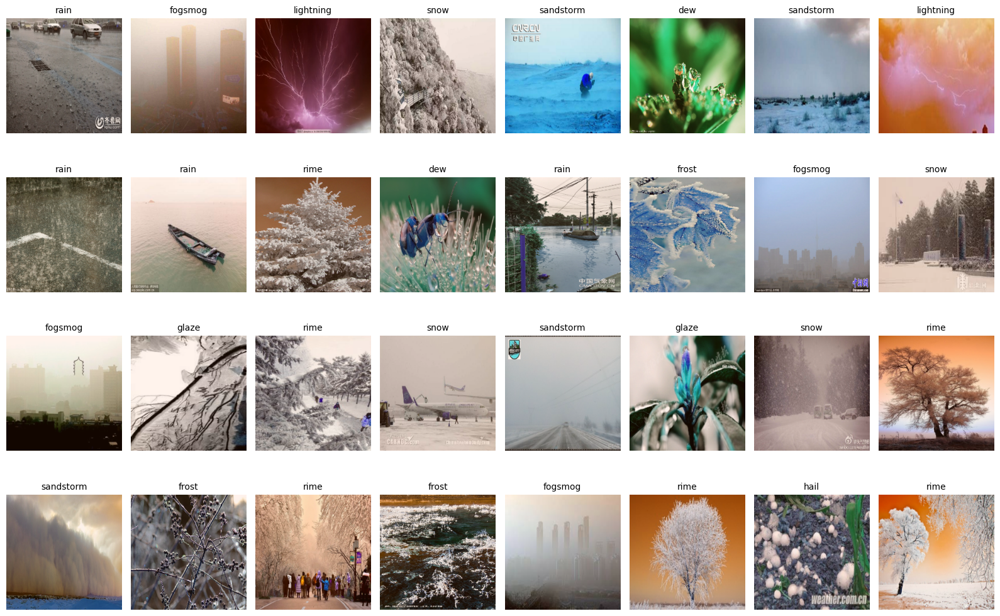

In [46]:
plt.figure(figsize=(16, 10.5))

# Take one batch from the validation dataset
for i, (image, label) in enumerate(validation_dataset.take(1).unbatch().take(Batch_size)): # Unbatch and take Batch_size images
    plt.subplot(4, 8, i + 1) # Assuming a 4x8 grid for 32 images

    # Reverse VGG16 preprocess_input for display (approximate)
    # For display, convert back to RGB and add means (or simply clip/normalize if means are not available).
    displayed_image = image.numpy()
    displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
    displayed_image = (displayed_image * 255).astype('uint8')

    plt.imshow(displayed_image)
    plt.title(f"{class_names[label.numpy()]}", fontsize=10)
    plt.axis('off')
plt.tight_layout()
plt.show()

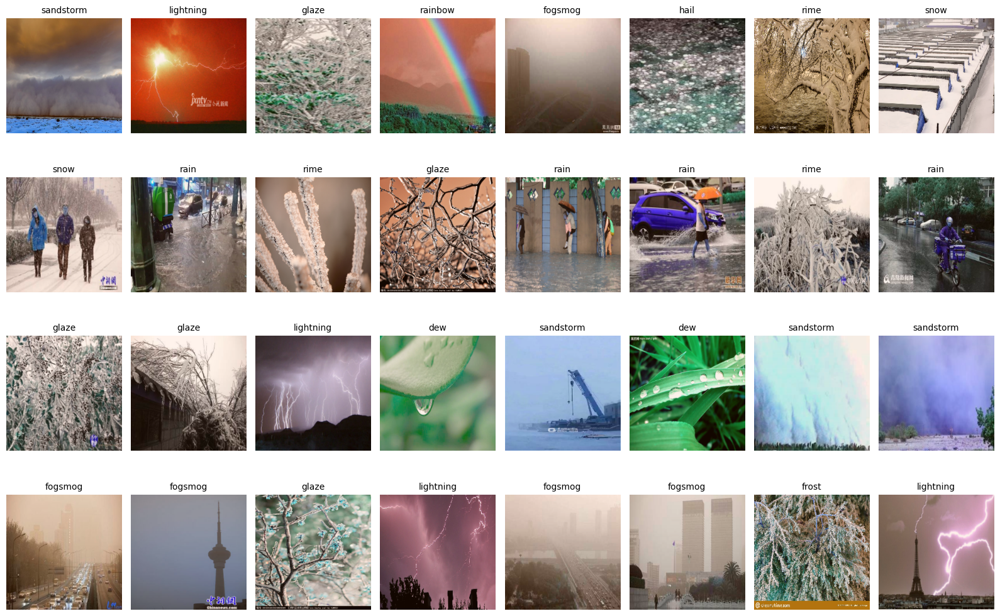

In [47]:
plt.figure(figsize=(16, 10.5))

# Take one batch from the testing dataset
for i, (image, label) in enumerate(Testing_dataset.take(1).unbatch().take(Batch_size)): # Unbatch and take Batch_size images
    plt.subplot(4, 8, i + 1) # Assuming a 4x8 grid for 32 images

    # Reverse VGG16 preprocess_input for display (approximate)
    # For display, convert back to RGB and add means (or simply clip/normalize if means are not available).
    displayed_image = image.numpy()
    displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
    displayed_image = (displayed_image * 255).astype('uint8')

    plt.imshow(displayed_image)
    plt.title(f"{class_names[label.numpy()]}", fontsize=10)
    plt.axis('off')
plt.tight_layout()
plt.show()

## Model Training

### VGGNet Implementation

In [48]:
VGGNet =  tf.keras.applications.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

VGGNet.trainable = False


In [49]:
model = keras.Sequential( name = "Transfer-Learning-via-VGG-for-FeatureExtraction" )        # name is optional

model.add( keras.layers.Input(shape=(224, 224, 3)))

model.add( keras.layers.Lambda(lambda x: VGGNet(x, training=False)) )  # Add VGGNet model layers in the inference mode ( frozen the all internal layers including the Batch Normalization Layers) , as we did VGGNet.trainable = False , if it was True we will add the VGGNet model directly
model.add( keras.layers.GlobalAveragePooling2D() )

model.add( keras.layers.BatchNormalization() )
model.add( keras.layers.Dense( 512 ) )
model.add( keras.layers.BatchNormalization() )
model.add( keras.layers.Activation('relu') )
model.add( keras.layers.Dropout(0.5) )

model.add( keras.layers.Dense( len ( class_names ) , activation='softmax' ) )
model.summary()

Model: "Transfer-Learning-via-VGG-for-FeatureExtraction"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_1 (Lambda)               │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 11)             │         5,643 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 272,395 (1.04 MB)

 Trainable params: 270,347 (1.03 MB)

 Non-trainable params: 2,048 (8.00 KB)

### Model compiling

In [50]:
model.compile(
    optimizer = keras.optimizers.Adam( learning_rate= 0.0001) ,
    loss      = keras.losses.SparseCategoricalCrossentropy(),
    metrics   = ['accuracy']
)

### Model Training For Feature Extraction  ( No Fine Tuning )

In [51]:
EPOCHS = 20

early_stop = keras.callbacks.EarlyStopping(
    monitor  ='val_loss',
    patience = 5 ,                # لو مفيش تحسن لمدة 5 دورات، وقّف
    restore_best_weights = True   # رجع لي أحسن أوزان وصل لها الموديل
)

reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.3,
    patience=3
)

history = model.fit(
    Train_dataset ,
    validation_data  = validation_dataset ,
    epochs = EPOCHS ,
    callbacks = [early_stop , reduce_lr]
)

Epoch 1/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 49s 288ms/step - accuracy: 0.2263 - loss: 2.5507 - val_accuracy: 0.6722 - val_loss: 1.1485 - learning_rate: 1.0000e-04
Epoch 2/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 42s 280ms/step - accuracy: 0.5955 - loss: 1.2582 - val_accuracy: 0.7682 - val_loss: 0.8281 - learning_rate: 1.0000e-04
Epoch 3/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 42s 280ms/step - accuracy: 0.6888 - loss: 0.9654 - val_accuracy: 0.7922 - val_loss: 0.6955 - learning_rate: 1.0000e-04
Epoch 4/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 82s 280ms/step - accuracy: 0.7420 - loss: 0.8001 - val_accuracy: 0.8016 - val_loss: 0.6231 - learning_rate: 1.0000e-04
Epoch 5/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - accuracy: 0.7866 - loss: 0.6893 - val_accuracy: 0.8110 - val_loss: 0.5882 - learning_rate: 1.0000e-04
Epoch 6/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 42s 278ms/step - accuracy: 0.7881 - loss: 0.6437 - val_accuracy: 0.8227 - val_loss: 0.5418 - learning_rate: 1.0000e-04
Epoch 7/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 42s 27

In [52]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Model Loss', 'Model Accuracy'))

# Add traces for loss
fig.add_trace(go.Scatter(y=history.history['loss'],
                         mode='lines',
                         name='Train Loss',
                         marker_color='blue'),
              row=1, col=1)
fig.add_trace(go.Scatter(y=history.history['val_loss'],
                         mode='lines',
                         name='Validation Loss',
                         marker_color='red'),
              row=1, col=1)

# Add traces for accuracy
fig.add_trace(go.Scatter(y=history.history['accuracy'],
                         mode='lines',
                         name='Train Accuracy',
                         marker_color='blue'),
              row=1, col=2)
fig.add_trace(go.Scatter(y=history.history['val_accuracy'],
                         mode='lines',
                         name='Validation Accuracy',
                         marker_color='red'),
              row=1, col=2)

# Update layout for better readability
fig.update_layout(height=550, width=1350, title_text="Model Training History")
fig.update_xaxes(title_text="Epoch", row=1, col=1)
fig.update_yaxes(title_text="Loss", row=1, col=1)
fig.update_xaxes(title_text="Epoch", row=1, col=2)
fig.update_yaxes(title_text="Accuracy", row=1, col=2)

fig.show()

## Model Evaluation

In [53]:
Test_Evaluation = model.evaluate(Testing_dataset)           # we can see the accuracy & loss using evaluate function but we can't with predict function

print(f"Final Testing Loss: {Test_Evaluation[0]:.2f}")
print(f"Final Testing Accuracy: {Test_Evaluation[1]:.2f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.8663 - loss: 0.4276
Final Testing Loss: 0.41
Final Testing Accuracy: 0.87


In [54]:
Test_predictions = model.predict(Testing_dataset)
probabilities    = tf.nn.softmax(Test_predictions)
predicted_labels = tf.argmax(probabilities, axis=1)


22/22 ━━━━━━━━━━━━━━━━━━━━ 13s 258ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


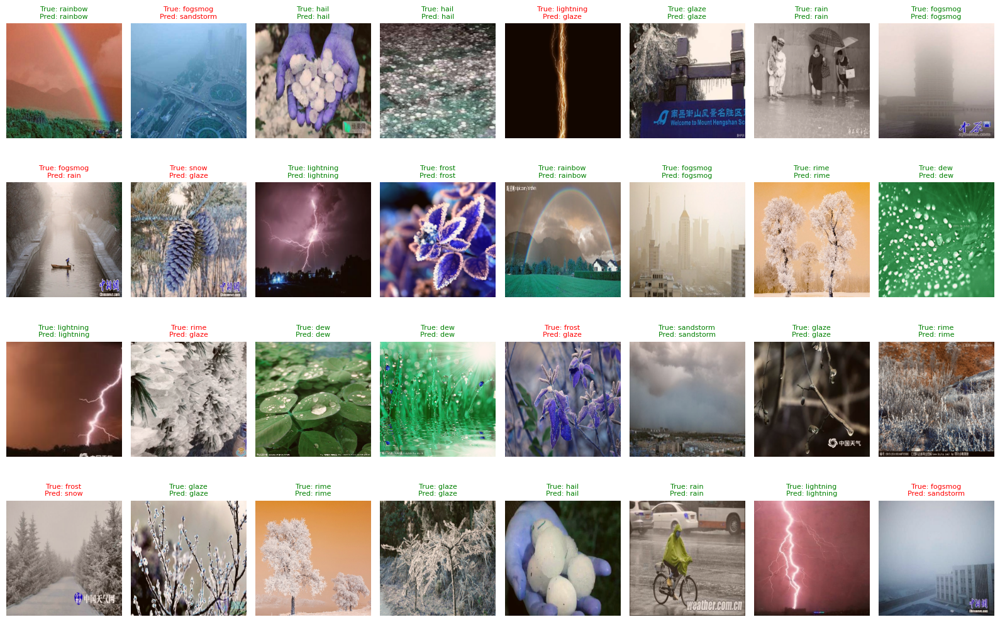

In [68]:
plt.figure(figsize=(16, 10.5))

current_batch_images = []
current_batch_true_labels = []

# Skip the first batch and take the second batch
for images, labels in Testing_dataset.skip(1).take(1):
    current_batch_images = images.numpy()
    current_batch_true_labels = labels.numpy()
    break

# Make predictions for this specific batch
second_batch_predictions = model.predict(tf.data.Dataset.from_tensor_slices((current_batch_images, current_batch_true_labels)).batch(Batch_size))
probabilities_second_batch = tf.nn.softmax(second_batch_predictions)
predicted_labels_second_batch = tf.argmax(probabilities_second_batch, axis=1)

if len(current_batch_images) > 0:
    for i in range(len(current_batch_images)):
        plt.subplot(4, 8, i + 1)

        # Display image: Reverse VGG16 preprocess_input for display (approximate)
        displayed_image = current_batch_images[i]
        displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
        displayed_image = (displayed_image * 255).astype('uint8')
        plt.imshow(displayed_image)

        true_label_idx = current_batch_true_labels[i]
        predicted_label_idx = predicted_labels_second_batch.numpy()[i]

        true_label_name = class_names[true_label_idx]
        predicted_label_name = class_names[predicted_label_idx]

        color = 'green' if true_label_idx == predicted_label_idx else 'red'
        plt.title(f"True: {true_label_name}\nPred: {predicted_label_name}", fontsize=8, color=color)
        plt.axis('off')

plt.tight_layout()
plt.show()

## Model Training with Fine Tuning

In [56]:
VGGNet.trainable = True

for layer in VGGNet.layers[:15]:     # freeze the first 15 layers in VGGNet base model which are responsible for feature extraction ( edges - textures - objects ... )
    layer.trainable = False


In [57]:
model = keras.Sequential( name = "Transfer-Learning-via-VGG-Fine-tuning" )        # name is optional

model.add( keras.layers.Input(shape=(224, 224, 3)))

model.add( VGGNet )                                    # All the allowed Trainable Layers in VGGNet are trainable now ( start from layer 15 ) , the extracted feature we got from the feature extraction phase is stored in this VGG module so we will use it now in the finw tuning phase instead of starting from the scratch so feature extraction phase is important
model.add( keras.layers.GlobalAveragePooling2D() )

model.add( keras.layers.BatchNormalization() )
model.add( keras.layers.Dense( 512 ) )
model.add( keras.layers.BatchNormalization() )
model.add( keras.layers.Activation('relu') )
model.add( keras.layers.Dropout(0.5) )

model.add( keras.layers.Dense( len ( class_names ) , activation='softmax' ) )
model.summary()

Model: "Transfer-Learning-via-VGG-Fine-tuning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 11)             │         5,643 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,987,083 (57.17 MB)

 Trainable params: 7,349,771 (28.04 MB)

 Non-trainable params: 7,637,312 (29.13 MB)

In [58]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)


In [59]:
History = model.fit(
    Train_dataset,
    validation_data = validation_dataset,
    epochs= 25 ,
    callbacks=[early_stop, reduce_lr]
)


Epoch 1/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 55s 330ms/step - accuracy: 0.1376 - loss: 2.8717 - val_accuracy: 0.5240 - val_loss: 1.4355 - learning_rate: 1.0000e-05
Epoch 2/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 45s 299ms/step - accuracy: 0.4803 - loss: 1.5443 - val_accuracy: 0.7558 - val_loss: 0.8227 - learning_rate: 1.0000e-05
Epoch 3/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 45s 298ms/step - accuracy: 0.6879 - loss: 0.9689 - val_accuracy: 0.8183 - val_loss: 0.6331 - learning_rate: 1.0000e-05
Epoch 4/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 46s 306ms/step - accuracy: 0.7811 - loss: 0.7385 - val_accuracy: 0.8430 - val_loss: 0.5464 - learning_rate: 1.0000e-05
Epoch 5/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 46s 306ms/step - accuracy: 0.8154 - loss: 0.6023 - val_accuracy: 0.8525 - val_loss: 0.4882 - learning_rate: 1.0000e-05
Epoch 6/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 45s 297ms/step - accuracy: 0.8433 - loss: 0.5261 - val_accuracy: 0.8663 - val_loss: 0.4492 - learning_rate: 1.0000e-05
Epoch 7/25
151/151 ━━━━━━━━━━━━━━━━━━━━ 45s 29

In [60]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Model Loss', 'Model Accuracy'))

# Add traces for loss
fig.add_trace(go.Scatter(y=history.history['loss'],
                         mode='lines',
                         name='Train Loss',
                         marker_color='blue'),
              row=1, col=1)
fig.add_trace(go.Scatter(y=history.history['val_loss'],
                         mode='lines',
                         name='Validation Loss',
                         marker_color='red'),
              row=1, col=1)

# Add traces for accuracy
fig.add_trace(go.Scatter(y=history.history['accuracy'],
                         mode='lines',
                         name='Train Accuracy',
                         marker_color='blue'),
              row=1, col=2)
fig.add_trace(go.Scatter(y=history.history['val_accuracy'],
                         mode='lines',
                         name='Validation Accuracy',
                         marker_color='red'),
              row=1, col=2)

# Update layout for better readability
fig.update_layout(height=550, width=1350, title_text="Model Training History")
fig.update_xaxes(title_text="Epoch", row=1, col=1)
fig.update_yaxes(title_text="Loss", row=1, col=1)
fig.update_xaxes(title_text="Epoch", row=1, col=2)
fig.update_yaxes(title_text="Accuracy", row=1, col=2)

fig.show()

## Model Final Evaluation

In [61]:
Test_Evaluation = model.evaluate(Testing_dataset)           # we can see the accuracy & loss using evaluate function but we can't with predict function

print(f"Final Testing Loss: {Test_Evaluation[0]:.2f}")
print(f"Final Testing Accuracy: {Test_Evaluation[1]:.2f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 14s 296ms/step - accuracy: 0.9114 - loss: 0.2994
Final Testing Loss: 0.32
Final Testing Accuracy: 0.90


In [ ]:
Test_predictions = model.predict(Testing_dataset)
probabilities    = tf.nn.softmax(Test_predictions)
predicted_labels = tf.argmax(probabilities, axis=1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


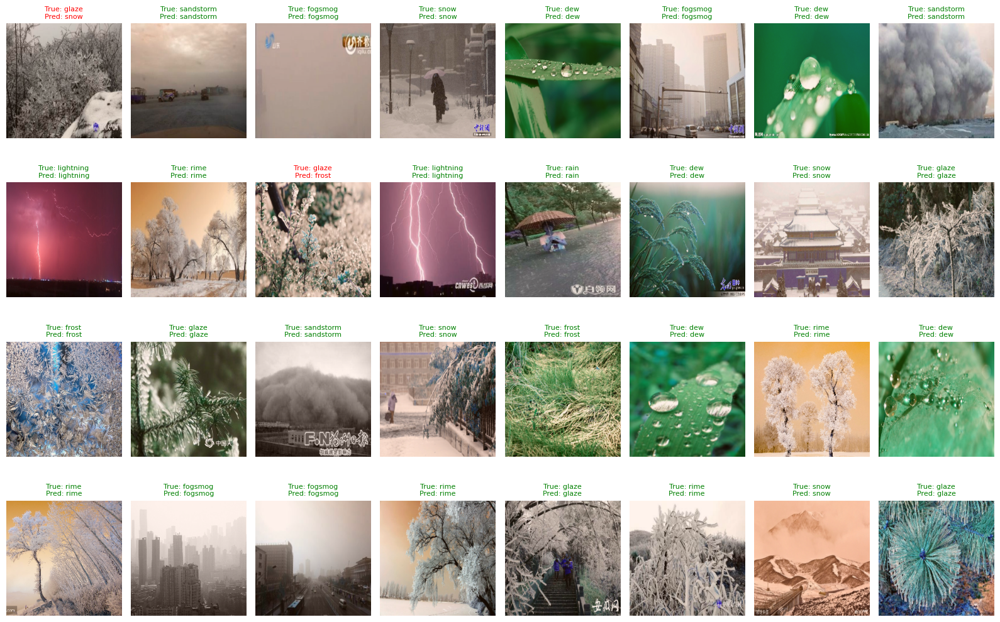

In [65]:
plt.figure(figsize=(16, 10.5))

current_batch_images = []
current_batch_true_labels = []

# Iterate to get the first batch of images and their true labels
# Ensure `Testing_dataset` is re-iterable if it's already consumed
for images, labels in Testing_dataset.take(1):
    current_batch_images = images.numpy()
    current_batch_true_labels = labels.numpy()
    break # Only take the first batch

# Make predictions for this specific batch
first_batch_predictions = model.predict(tf.data.Dataset.from_tensor_slices((current_batch_images, current_batch_true_labels)).batch(Batch_size))
probabilities_first_batch = tf.nn.softmax(first_batch_predictions)
predicted_labels_first_batch = tf.argmax(probabilities_first_batch, axis=1)

if len(current_batch_images) > 0:
    for i in range(len(current_batch_images)):
        plt.subplot(4, 8, i + 1)

        # Display image: Reverse VGG16 preprocess_input for display (approximate)
        displayed_image = current_batch_images[i]
        displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
        displayed_image = (displayed_image * 255).astype('uint8')
        plt.imshow(displayed_image)

        true_label_idx = current_batch_true_labels[i]
        predicted_label_idx = predicted_labels_first_batch.numpy()[i]

        true_label_name = class_names[true_label_idx]
        predicted_label_name = class_names[predicted_label_idx]

        color = 'green' if true_label_idx == predicted_label_idx else 'red'
        plt.title(f"True: {true_label_name}\nPred: {predicted_label_name}", fontsize=8, color=color)
        plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


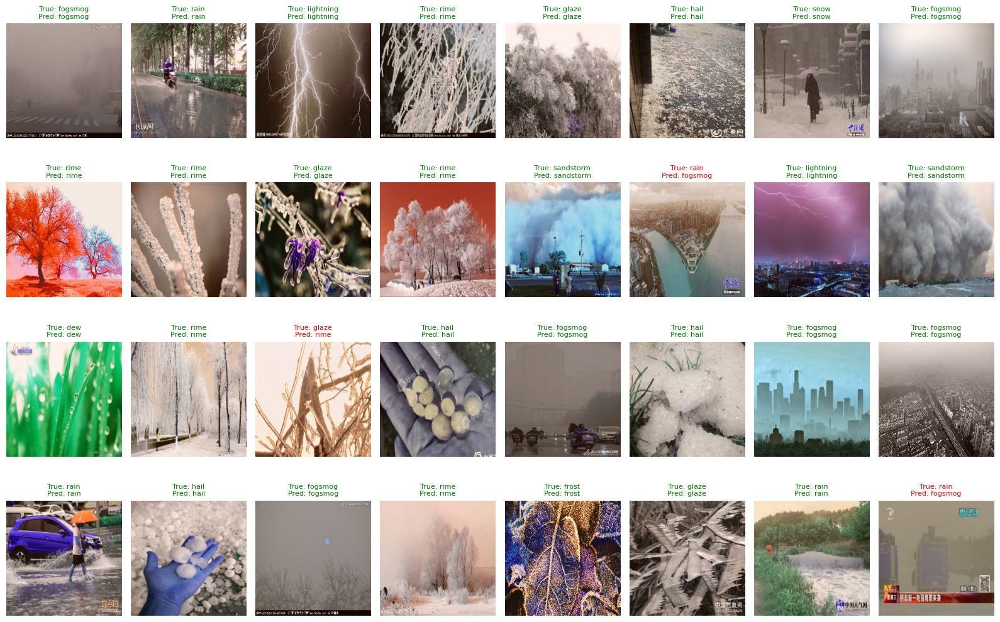

In [63]:
plt.figure(figsize=(16, 10.5))

# Skip the first batch and take the second batch
for images, labels in Testing_dataset.skip(1).take(1):
    current_batch_images = images.numpy()
    current_batch_true_labels = labels.numpy()
    break

# Make predictions for this specific batch
second_batch_predictions = model.predict(tf.data.Dataset.from_tensor_slices((current_batch_images, current_batch_true_labels)).batch(Batch_size))
probabilities_second_batch = tf.nn.softmax(second_batch_predictions)
predicted_labels_second_batch = tf.argmax(probabilities_second_batch, axis=1)

if len(current_batch_images) > 0:
    for i in range(len(current_batch_images)):
        plt.subplot(4, 8, i + 1)

        # Display image: Reverse VGG16 preprocess_input for display (approximate)
        displayed_image = current_batch_images[i]
        displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
        displayed_image = (displayed_image * 255).astype('uint8')
        plt.imshow(displayed_image)

        true_label_idx = current_batch_true_labels[i]
        predicted_label_idx = predicted_labels_second_batch.numpy()[i]

        true_label_name = class_names[true_label_idx]
        predicted_label_name = class_names[predicted_label_idx]

        color = 'green' if true_label_idx == predicted_label_idx else 'red'
        plt.title(f"True: {true_label_name}\nPred: {predicted_label_name}", fontsize=8, color=color)
        plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


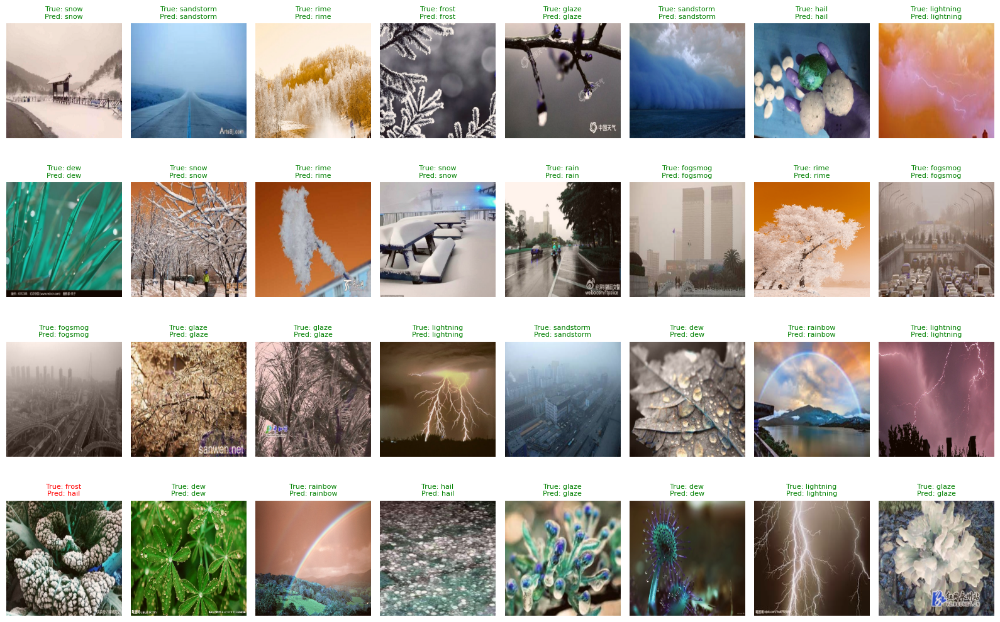

In [64]:
plt.figure(figsize=(16, 10.5))

# Skip the first two batches and take the third batch
for images, labels in Testing_dataset.skip(2).take(1):
    current_batch_images = images.numpy()
    current_batch_true_labels = labels.numpy()
    break

# Make predictions for this specific batch
third_batch_predictions = model.predict(tf.data.Dataset.from_tensor_slices((current_batch_images, current_batch_true_labels)).batch(Batch_size))
probabilities_third_batch = tf.nn.softmax(third_batch_predictions)
predicted_labels_third_batch = tf.argmax(probabilities_third_batch, axis=1)

if len(current_batch_images) > 0:
    for i in range(len(current_batch_images)):
        plt.subplot(4, 8, i + 1)

        # Display image: Reverse VGG16 preprocess_input for display (approximate)
        displayed_image = current_batch_images[i]
        displayed_image = (displayed_image - displayed_image.min()) / (displayed_image.max() - displayed_image.min())
        displayed_image = (displayed_image * 255).astype('uint8')
        plt.imshow(displayed_image)

        true_label_idx = current_batch_true_labels[i]
        predicted_label_idx = predicted_labels_third_batch.numpy()[i]

        true_label_name = class_names[true_label_idx]
        predicted_label_name = class_names[predicted_label_idx]

        color = 'green' if true_label_idx == predicted_label_idx else 'red'
        plt.title(f"True: {true_label_name}\nPred: {predicted_label_name}", fontsize=8, color=color)
        plt.axis('off')

plt.tight_layout()
plt.show()